In [1]:
import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import pickle 
import tensorflow_datasets as tfds
from google.colab import files

In [2]:
batch_size = 32

# Load dataset
(X_train, y_train), (X_test, y_test) = tf.keras.datasets.cifar10.load_data()
dataset_images = np.r_[X_train, X_test]

# normalize values
dataset_images = dataset_images/ 255.


170508288/170498071 [==============================] - 11s 0us/step


In [3]:
# Discriminator architecture (per Radford et al.)

# The discriminator takes a 32x32 RGB image and classifies it to a binary value (0=fake or 1=real)
# It is a relatively simple classifier, but will be trained using two separate loss functions (in discriminator and generator training)
discriminator = keras.Sequential(
    [
        # Input layer for 32x32 RGB image
        keras.Input(shape=(32, 32, 3)),
     
        # First convolutional layer w/ activation
        keras.layers.Conv2D(64, kernel_size=4, strides=2, padding="same"),
        keras.layers.LeakyReLU(alpha=0.2),

        # Second convolutional layer w/ activation
        keras.layers.Conv2D(128, kernel_size=4, strides=2, padding="same"),
        keras.layers.LeakyReLU(alpha=0.2),
     
        # Flatten layer for mapping to output
        keras.layers.Flatten(),
     
        # Dropout layer to prevent overfitting
        keras.layers.Dropout(0.2),
     
        # Dense layer w/ sigmoid to map to output
        keras.layers.Dense(1, activation="sigmoid"),
    ],
    name="Discriminator",
)
discriminator.summary()

Model: "Discriminator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 16, 16, 64)        3136      
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 16, 16, 64)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 8, 8, 128)         131200    
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 8, 8, 128)         0         
                                                                 
 flatten (Flatten)           (None, 8192)              0         
                                                                 
 dropout (Dropout)           (None, 8192)              0         
                                                                 
 dense (Dense)               (None, 1)               

In [4]:
# Generator architecture (per Radford et al.)

# The generator creates fake images to feed into the discriminator
# The goal is to trick the discriminator into thinking the generated image is real
# At first, the generator is given random noise; it gets better by iteratively computing loss from the discriminator and backpropagating

noiseDim = 100 # dimension of uniform distribution vector Z
latent_dim = 100

generator = keras.Sequential(
    [
        # Start with vector Z
        keras.layers.Input(shape=(noiseDim,)),
        
        # Project and reshape to 4x4x1024
        keras.layers.Dense(4*4*1024, input_shape = [noiseDim]),
        keras.layers.Reshape([4, 4, 1024]),
        
        # First fractionally-strided convolutional layer (Transpose Convolution) with leaky ReLU activation 
        keras.layers.Conv2DTranspose(512, kernel_size = 4, padding = "same", strides = 2),
        #keras.layers.BatchNormalization(),
        keras.layers.LeakyReLU(alpha=0.2),
  
        # Second convolutional layer
        keras.layers.Conv2DTranspose(256, kernel_size = 4, padding = "same", strides = 2),
        keras.layers.LeakyReLU(alpha=0.2),
        #keras.layers.BatchNormalization(),
           
        # Final layer outputting a 32x32x3 image 
        keras.layers.Conv2DTranspose(3, kernel_size=4, strides=2, padding="same",
                                  activation='sigmoid'),
    ],
    name="Generator",
)

generator.summary()

Model: "Generator"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_1 (Dense)             (None, 16384)             1654784   
                                                                 
 reshape (Reshape)           (None, 4, 4, 1024)        0         
                                                                 
 conv2d_transpose (Conv2DTra  (None, 8, 8, 512)        8389120   
 nspose)                                                         
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 8, 8, 512)         0         
                                                                 
 conv2d_transpose_1 (Conv2DT  (None, 16, 16, 256)      2097408   
 ranspose)                                                       
                                                                 
 leaky_re_lu_3 (LeakyReLU)   (None, 16, 16, 256)       0 

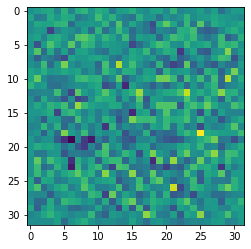

In [5]:
# Testing image generation out of random noise
noise_shape = 100

noise = tf.random.normal([1,noise_shape])
image = generator(noise, training=False)
plt.imshow(image[0, :, :, 0])

In [6]:
# for ease of compilation and overriding, we define GAN as a class, inheriting keras.Model
class GAN(keras.Model):
    def __init__(self, discriminator, generator):
        super(GAN, self).__init__()
        self.discriminator = discriminator
        self.generator = generator
    
    # encode all the necessary compilation information
    def compile(self):
        super(GAN, self).compile()
        self.discriminatorOpt = keras.optimizers.Adam(learning_rate=0.0001) 
        self.generatorOpt = keras.optimizers.Adam(learning_rate=0.0001) 
        self.loss = keras.losses.BinaryCrossentropy()
        self.d_loss_metric = keras.metrics.Mean(name="discriminatorLoss")
        self.g_loss_metric = keras.metrics.Mean(name="generatorLoss")

    # The metrics to keep track of discriminator and generator loss
    @property
    def metrics(self):
      return [self.d_loss_metric, self.g_loss_metric]
       
    # override keras' default train_step function since we're training 2 models at once   
    def train_step(self, images):
        ## Discriminator Training

        # Get random points from latent noise z-distribution 
        batch_size = tf.shape(images)[0]
        noise = tf.random.normal(shape=(batch_size, noise_shape))

        # Turn this into fake images using the generator
        generated_images = self.generator(noise)

        # Combine real images with fake images
        combined_images = tf.concat([generated_images, images], axis=0)

        # Concatenate real and fake labels
        labels = tf.concat(
            [tf.ones((batch_size, 1)), tf.zeros((batch_size, 1))], axis=0
        )

        # Add noise to labels to make training more robust
        labels += 0.05 * tf.random.uniform(tf.shape(labels))

        # Train the discriminator
        with tf.GradientTape() as tape:
            # get discriminator predictions on real vs fake
            discriminatorPredictions = self.discriminator(combined_images)
            # calculate loss on discriminator
            discriminatorLoss = self.loss(labels, discriminatorPredictions)

        # get gradients and update discriminator weights
        gradients = tape.gradient(discriminatorLoss, self.discriminator.trainable_weights)
        self.discriminatorOpt.apply_gradients(zip(gradients, self.discriminator.trainable_weights))

        ## Generator Training

        # Get noise again from normal distribution
        noise = tf.random.normal(shape=(batch_size, noise_shape))

        # Creating np array of all-zeros to 
        real = tf.zeros((batch_size, 1))

        # Train the generator 
        with tf.GradientTape() as tape:
            # get discriminator predictions for newly generated fake images
            discriminatorPredictions = self.discriminator(self.generator(noise))
            # get the generator's loss (not discriminator) given discriminator's predictions
            generatorLoss = self.loss(real, discriminatorPredictions)

        # get gradients of generator loss
        gradients = tape.gradient(generatorLoss, self.generator.trainable_weights)
        # update generator weights, but keep discriminator's weights the same 
        self.generatorOpt.apply_gradients(zip(gradients, self.generator.trainable_weights))

        # Update metrics
        self.d_loss_metric.update_state(discriminatorLoss)
        self.g_loss_metric.update_state(generatorLoss)
        return {
            "discriminatorLoss": self.d_loss_metric.result(),
            "generatorLoss": self.g_loss_metric.result(),
        }


from google.colab import drive
drive.mount('/content/gdrive')

# callback function to save images and data 
class customCallback(keras.callbacks.Callback):
  def __init__(self, images):
    self.images = images

  # override on_epoch_end to display images after each epoch is done training
  def on_epoch_end(self, epoch, logs=None):
    noise = tf.random.normal(shape=(self.images, noise_shape))
    # get fake generated images
    fake = self.model.generator(noise)
    fake *= 255
    fake.numpy()
    for i in range(self.images):
      # create images and print them
      image = keras.preprocessing.image.array_to_img(fake[i])
      image.save("/content/gdrive/My Drive/images_DCGAN_3/generated_img_%03d_%d.png" % (epoch+1, i))
      plt.subplot(2, 5, i+1)
      plt.imshow(fake[i].numpy().astype('uint8'))
      plt.xticks([])  
      plt.yticks([]) 
    plt.tight_layout()
    plt.show()


Mounted at /content/gdrive


Epoch 1/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.6773 - generatorLoss: 0.9616

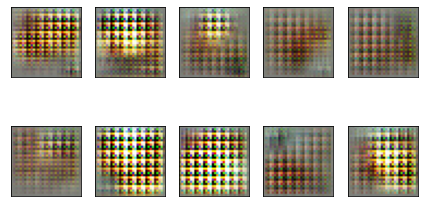

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.6773 - generatorLoss: 0.9615
Epoch 2/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6888 - generatorLoss: 0.8889

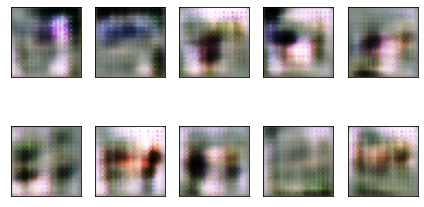

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6888 - generatorLoss: 0.8889
Epoch 3/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6903 - generatorLoss: 0.8176

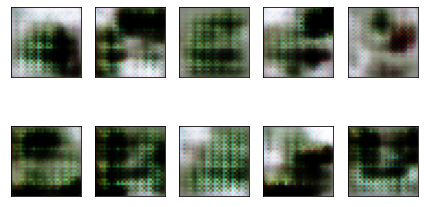

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6903 - generatorLoss: 0.8176
Epoch 4/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6887 - generatorLoss: 0.8579

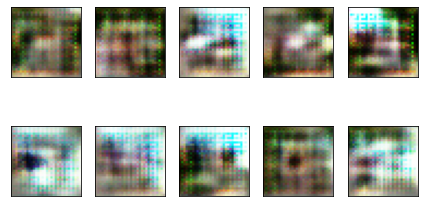

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6887 - generatorLoss: 0.8579
Epoch 5/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6914 - generatorLoss: 0.8530

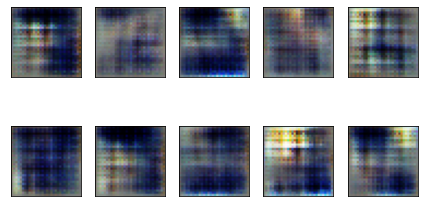

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6914 - generatorLoss: 0.8530
Epoch 6/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6965 - generatorLoss: 0.8428

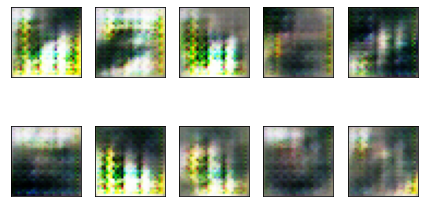

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6965 - generatorLoss: 0.8428
Epoch 7/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7014 - generatorLoss: 0.8537

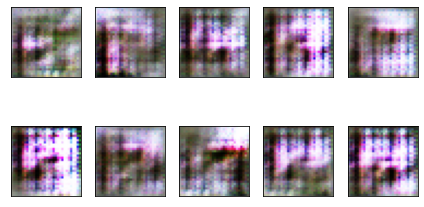

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7014 - generatorLoss: 0.8537
Epoch 8/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6991 - generatorLoss: 0.8864

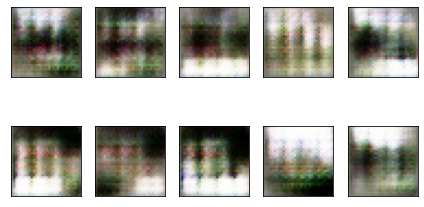

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6991 - generatorLoss: 0.8864
Epoch 9/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7035 - generatorLoss: 0.8037

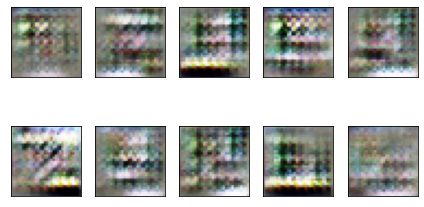

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7035 - generatorLoss: 0.8037
Epoch 10/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7053 - generatorLoss: 0.8394

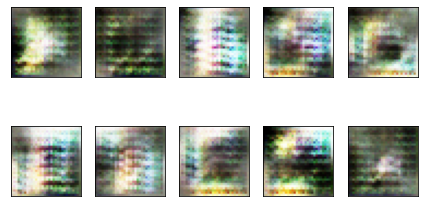

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7053 - generatorLoss: 0.8394
Epoch 11/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7018 - generatorLoss: 0.8429

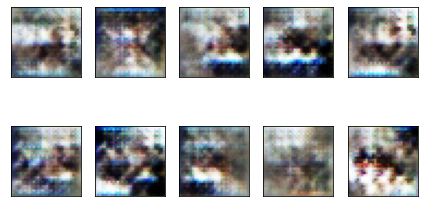

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7018 - generatorLoss: 0.8429
Epoch 12/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6969 - generatorLoss: 0.8234

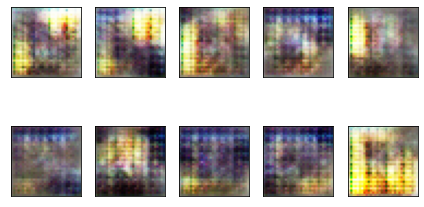

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.6969 - generatorLoss: 0.8234
Epoch 13/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7084 - generatorLoss: 0.8213

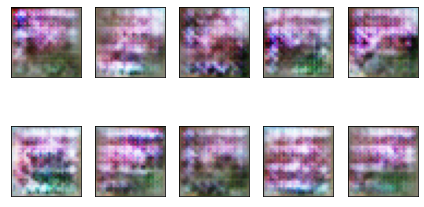

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7084 - generatorLoss: 0.8213
Epoch 14/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7042 - generatorLoss: 0.8028

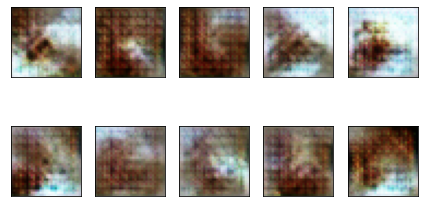

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7042 - generatorLoss: 0.8028
Epoch 15/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6975 - generatorLoss: 0.8168

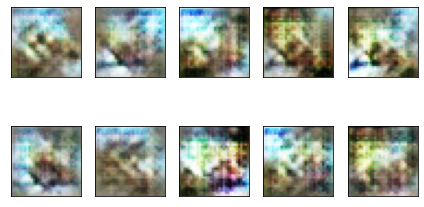

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6975 - generatorLoss: 0.8168
Epoch 16/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7022 - generatorLoss: 0.8129

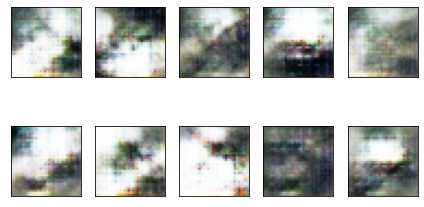

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7022 - generatorLoss: 0.8129
Epoch 17/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7063 - generatorLoss: 0.8158

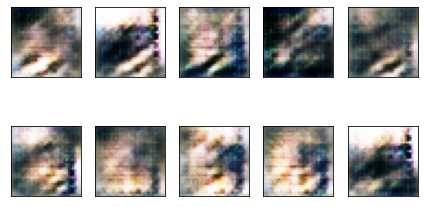

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7063 - generatorLoss: 0.8158
Epoch 18/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7040 - generatorLoss: 0.7917

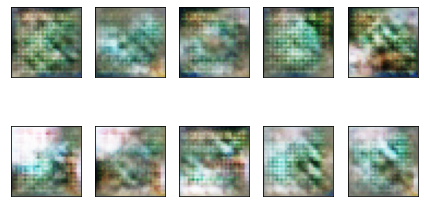

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7040 - generatorLoss: 0.7917
Epoch 19/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7137 - generatorLoss: 0.7884

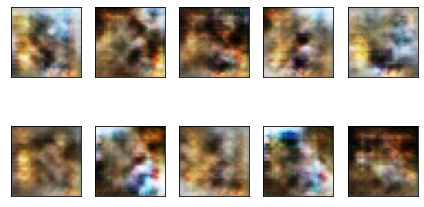

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7137 - generatorLoss: 0.7884
Epoch 20/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7058 - generatorLoss: 0.7801

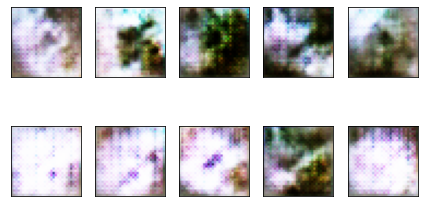

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7058 - generatorLoss: 0.7801
Epoch 21/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7106 - generatorLoss: 0.7943

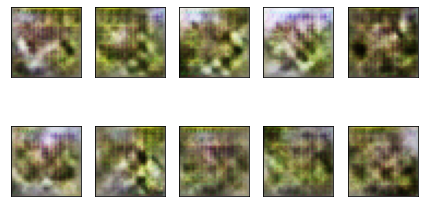

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7106 - generatorLoss: 0.7943
Epoch 22/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7073 - generatorLoss: 0.8007

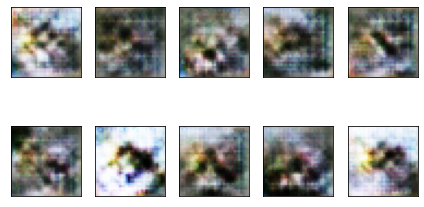

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7073 - generatorLoss: 0.8007
Epoch 23/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7003 - generatorLoss: 0.7768

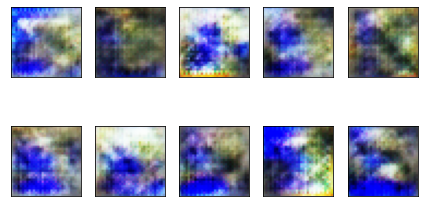

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7003 - generatorLoss: 0.7768
Epoch 24/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7131 - generatorLoss: 0.7962

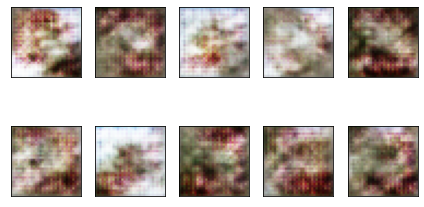

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7131 - generatorLoss: 0.7962
Epoch 25/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7000 - generatorLoss: 0.7889

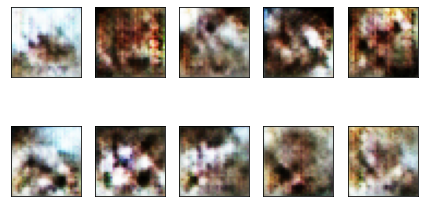

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7000 - generatorLoss: 0.7889
Epoch 26/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7094 - generatorLoss: 0.7993

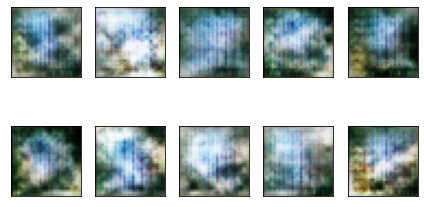

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7094 - generatorLoss: 0.7993
Epoch 27/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7009 - generatorLoss: 0.7774

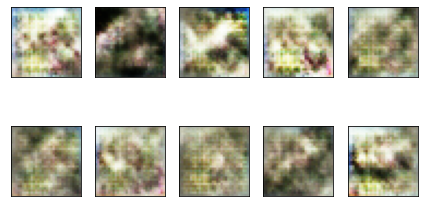

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7009 - generatorLoss: 0.7774
Epoch 28/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7054 - generatorLoss: 0.7756

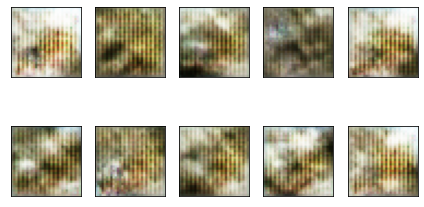

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7054 - generatorLoss: 0.7756
Epoch 29/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7110 - generatorLoss: 0.7895

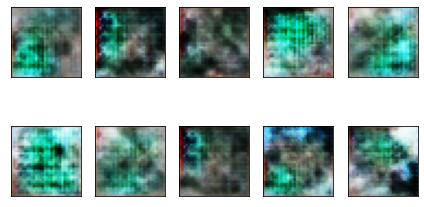

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7110 - generatorLoss: 0.7895
Epoch 30/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7064 - generatorLoss: 0.7782

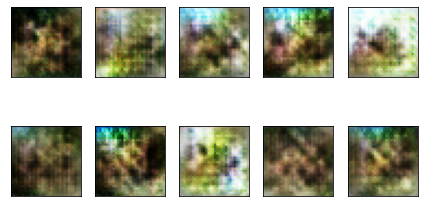

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7064 - generatorLoss: 0.7782
Epoch 31/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7017 - generatorLoss: 0.7842

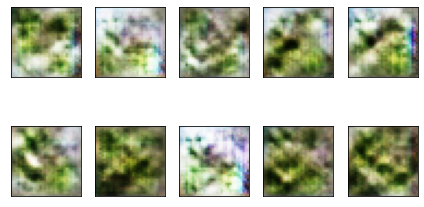

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7017 - generatorLoss: 0.7842
Epoch 32/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7094 - generatorLoss: 0.7808

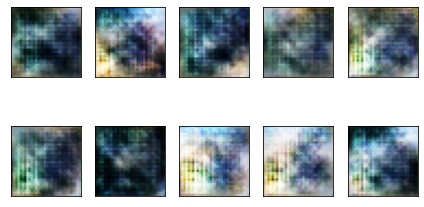

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7094 - generatorLoss: 0.7808
Epoch 33/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7115 - generatorLoss: 0.7851

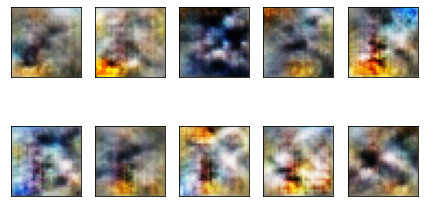

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7115 - generatorLoss: 0.7851
Epoch 34/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7105 - generatorLoss: 0.7784

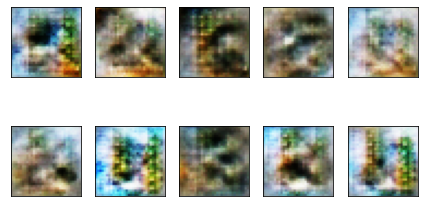

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7105 - generatorLoss: 0.7784
Epoch 35/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7052 - generatorLoss: 0.7704

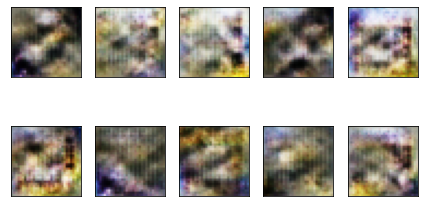

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7052 - generatorLoss: 0.7704
Epoch 36/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7101 - generatorLoss: 0.7735

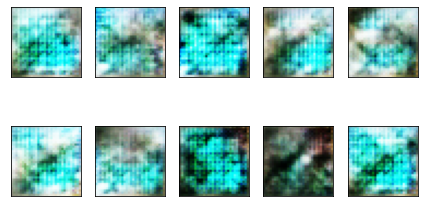

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7101 - generatorLoss: 0.7735
Epoch 37/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7078 - generatorLoss: 0.7929

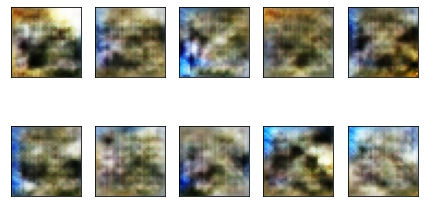

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7078 - generatorLoss: 0.7929
Epoch 38/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7049 - generatorLoss: 0.7643

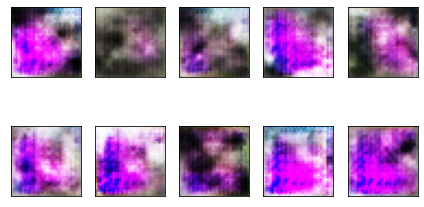

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7049 - generatorLoss: 0.7643
Epoch 39/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7065 - generatorLoss: 0.7778

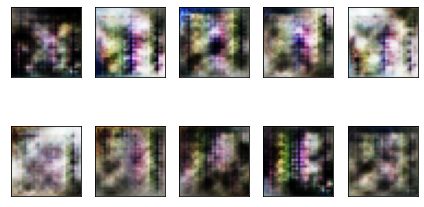

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7065 - generatorLoss: 0.7778
Epoch 40/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7128 - generatorLoss: 0.7836

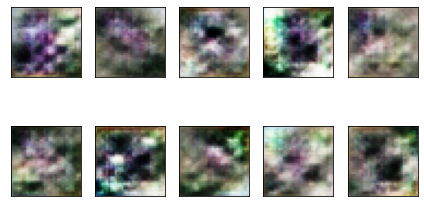

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7128 - generatorLoss: 0.7836
Epoch 41/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7101 - generatorLoss: 0.7746

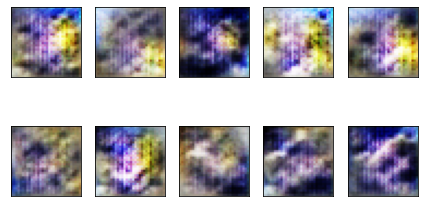

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7101 - generatorLoss: 0.7746
Epoch 42/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7007 - generatorLoss: 0.7676

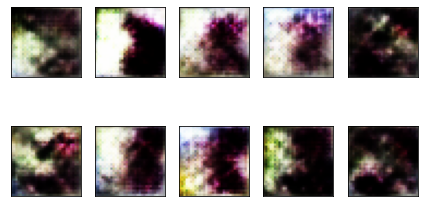

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7007 - generatorLoss: 0.7676
Epoch 43/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7078 - generatorLoss: 0.7802

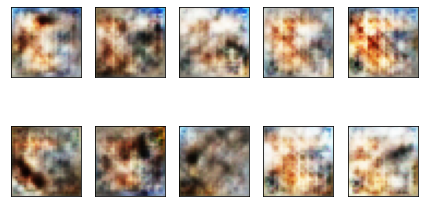

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7078 - generatorLoss: 0.7802
Epoch 44/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7074 - generatorLoss: 0.7721

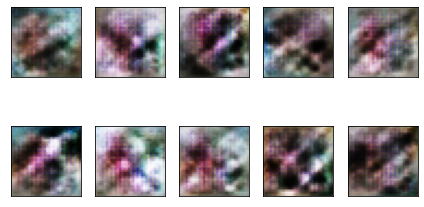

1875/1875 [==============================] - 76s 41ms/step - discriminatorLoss: 0.7074 - generatorLoss: 0.7721
Epoch 45/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7121 - generatorLoss: 0.7750

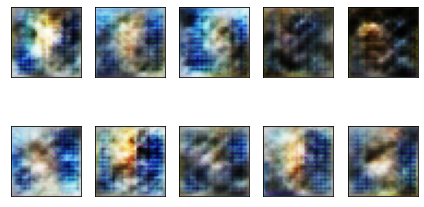

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7121 - generatorLoss: 0.7750
Epoch 46/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7088 - generatorLoss: 0.7740

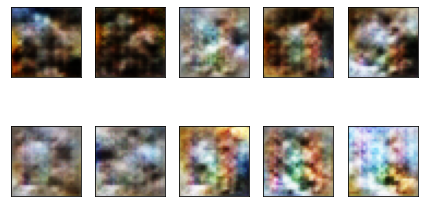

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7088 - generatorLoss: 0.7740
Epoch 47/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7043 - generatorLoss: 0.7679

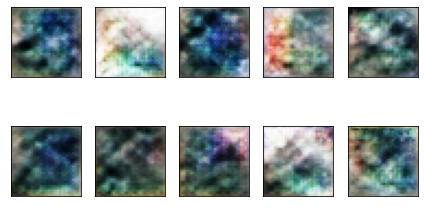

1875/1875 [==============================] - 78s 42ms/step - discriminatorLoss: 0.7043 - generatorLoss: 0.7679
Epoch 48/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7092 - generatorLoss: 0.7783

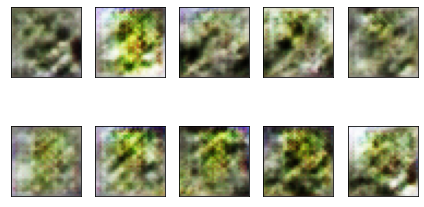

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7092 - generatorLoss: 0.7783
Epoch 49/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7034 - generatorLoss: 0.7771

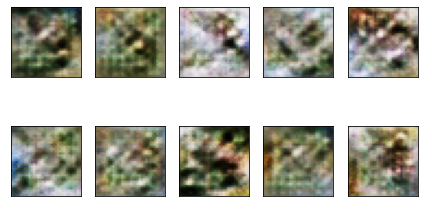

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7034 - generatorLoss: 0.7771
Epoch 50/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7001 - generatorLoss: 0.7623

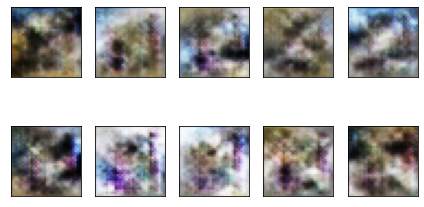

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7001 - generatorLoss: 0.7623
Epoch 51/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7107 - generatorLoss: 0.7799

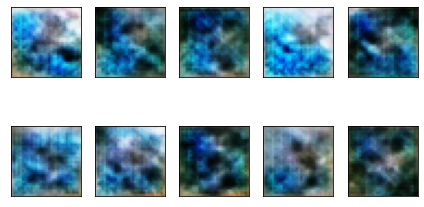

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7107 - generatorLoss: 0.7799
Epoch 52/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7037 - generatorLoss: 0.7773

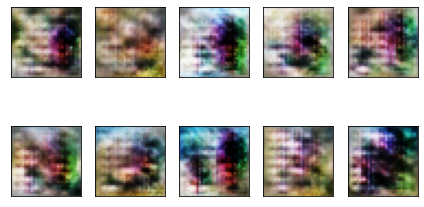

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7037 - generatorLoss: 0.7773
Epoch 53/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7069 - generatorLoss: 0.7785

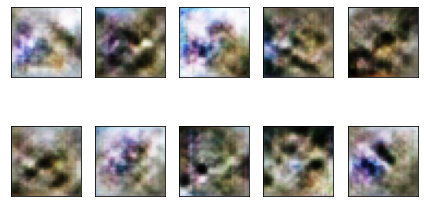

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7069 - generatorLoss: 0.7785
Epoch 54/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7038 - generatorLoss: 0.7703

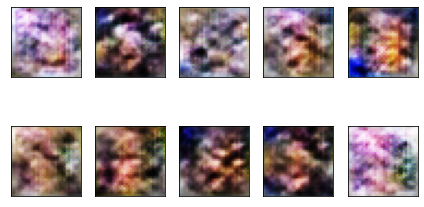

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7038 - generatorLoss: 0.7703
Epoch 55/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7143 - generatorLoss: 0.7845

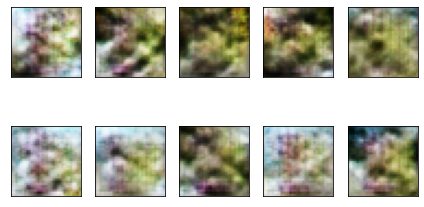

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7143 - generatorLoss: 0.7845
Epoch 56/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7064 - generatorLoss: 0.7759

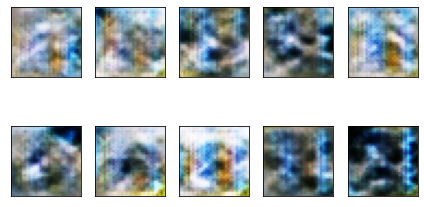

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7064 - generatorLoss: 0.7759
Epoch 57/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7086 - generatorLoss: 0.7827

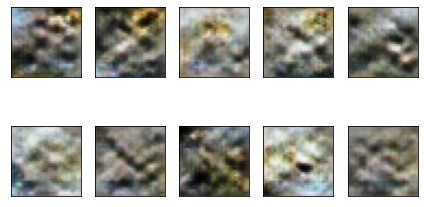

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7086 - generatorLoss: 0.7827
Epoch 58/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7097 - generatorLoss: 0.7837

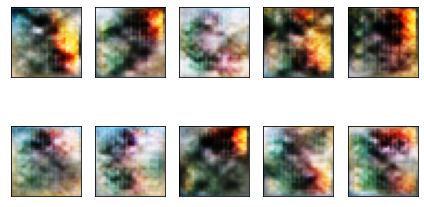

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7097 - generatorLoss: 0.7836
Epoch 59/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7030 - generatorLoss: 0.7667

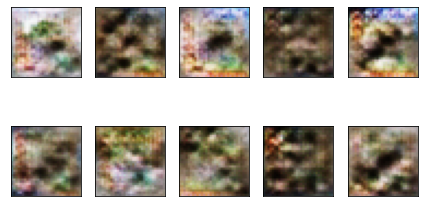

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7030 - generatorLoss: 0.7667
Epoch 60/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7091 - generatorLoss: 0.7741

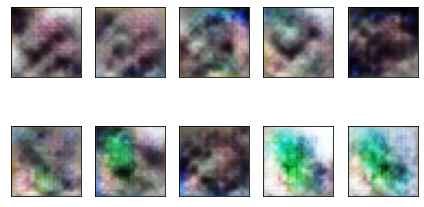

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7091 - generatorLoss: 0.7741
Epoch 61/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7122 - generatorLoss: 0.7768

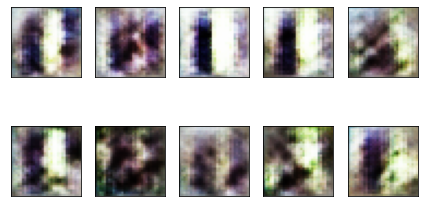

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7122 - generatorLoss: 0.7768
Epoch 62/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7076 - generatorLoss: 0.7762

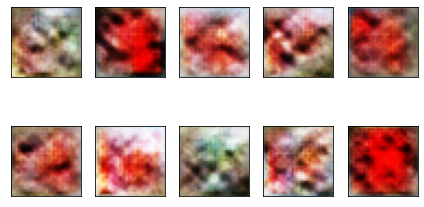

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7076 - generatorLoss: 0.7762
Epoch 63/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7085 - generatorLoss: 0.7685

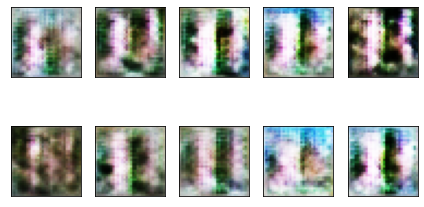

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7085 - generatorLoss: 0.7685
Epoch 64/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7196 - generatorLoss: 0.8024

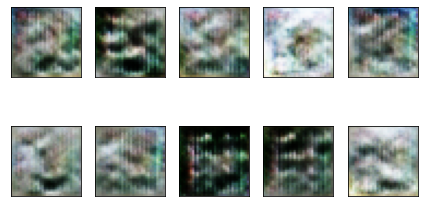

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7196 - generatorLoss: 0.8024
Epoch 65/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7057 - generatorLoss: 0.7745

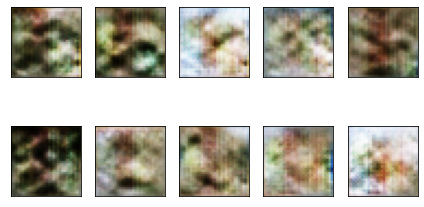

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7057 - generatorLoss: 0.7745
Epoch 66/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7094 - generatorLoss: 0.7627

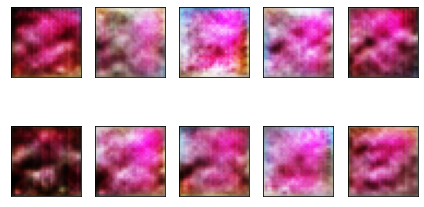

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7094 - generatorLoss: 0.7627
Epoch 67/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7066 - generatorLoss: 0.7852

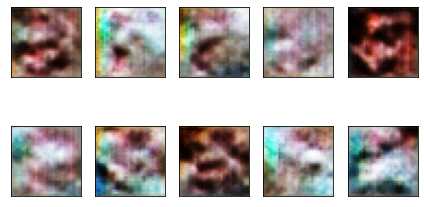

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7066 - generatorLoss: 0.7852
Epoch 68/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7126 - generatorLoss: 0.7704

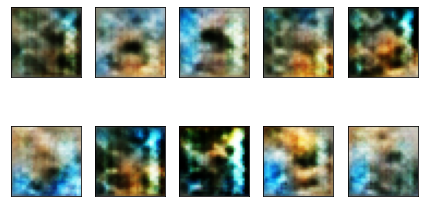

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7126 - generatorLoss: 0.7704
Epoch 69/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7094 - generatorLoss: 0.7682

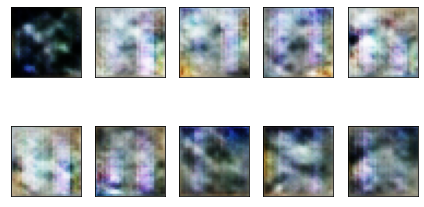

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7094 - generatorLoss: 0.7682
Epoch 70/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7123 - generatorLoss: 0.7797

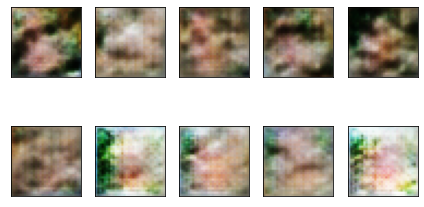

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7123 - generatorLoss: 0.7797
Epoch 71/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7066 - generatorLoss: 0.7791

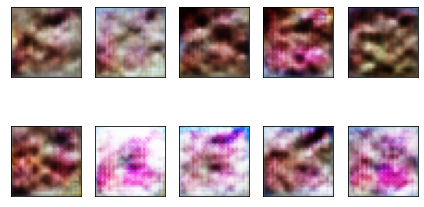

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7066 - generatorLoss: 0.7791
Epoch 72/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7045 - generatorLoss: 0.7590

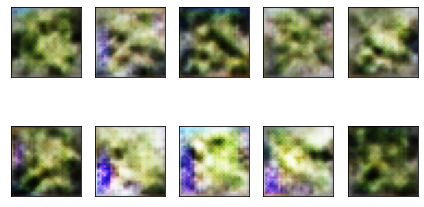

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7045 - generatorLoss: 0.7590
Epoch 73/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7079 - generatorLoss: 0.7773

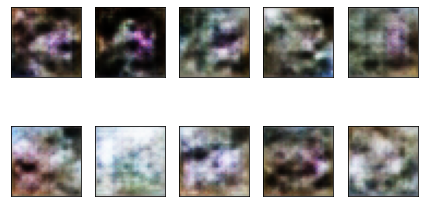

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7079 - generatorLoss: 0.7773
Epoch 74/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7162 - generatorLoss: 0.7694

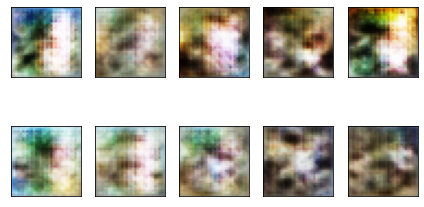

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7162 - generatorLoss: 0.7694
Epoch 75/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7084 - generatorLoss: 0.7749

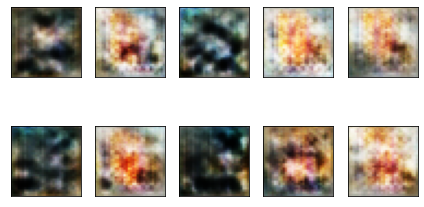

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7083 - generatorLoss: 0.7749
Epoch 76/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7102 - generatorLoss: 0.7701

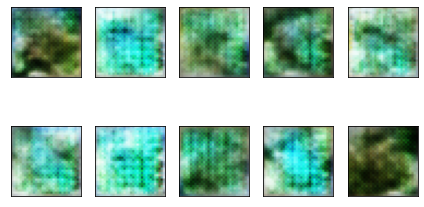

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7102 - generatorLoss: 0.7701
Epoch 77/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7056 - generatorLoss: 0.7670

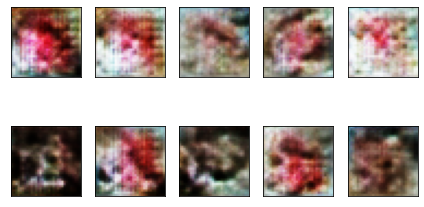

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7056 - generatorLoss: 0.7670
Epoch 78/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7057 - generatorLoss: 0.7741

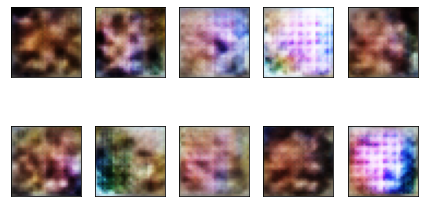

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7058 - generatorLoss: 0.7741
Epoch 79/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7066 - generatorLoss: 0.7630

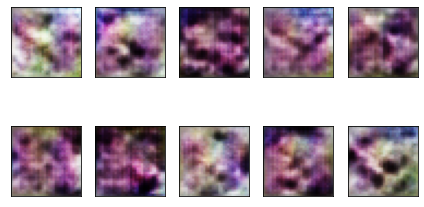

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7066 - generatorLoss: 0.7630
Epoch 80/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7051 - generatorLoss: 0.7720

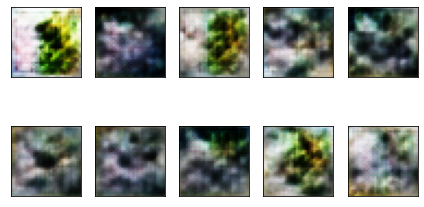

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7051 - generatorLoss: 0.7720
Epoch 81/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7033 - generatorLoss: 0.7667

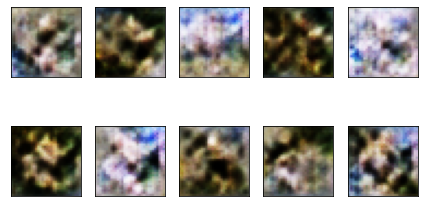

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7033 - generatorLoss: 0.7667
Epoch 82/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7149 - generatorLoss: 0.7817

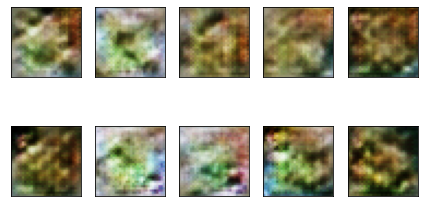

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7149 - generatorLoss: 0.7818
Epoch 83/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7078 - generatorLoss: 0.7676

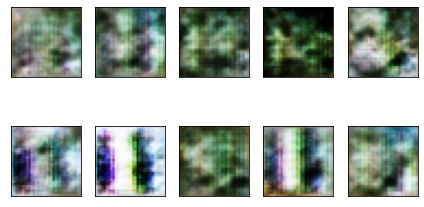

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7078 - generatorLoss: 0.7676
Epoch 84/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7058 - generatorLoss: 0.7668

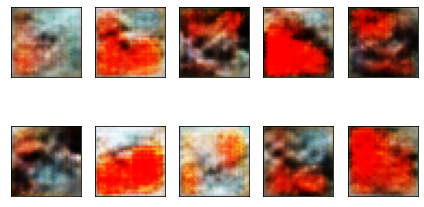

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.7058 - generatorLoss: 0.7668
Epoch 85/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7134 - generatorLoss: 0.7826

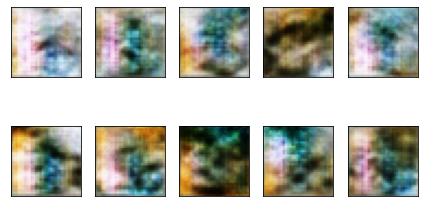

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7134 - generatorLoss: 0.7826
Epoch 86/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7088 - generatorLoss: 0.7713

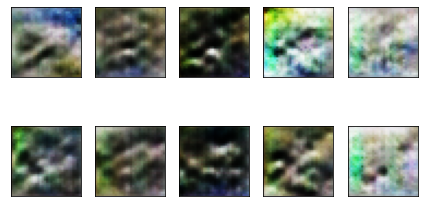

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7088 - generatorLoss: 0.7713
Epoch 87/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7136 - generatorLoss: 0.7750

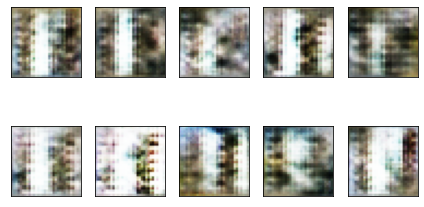

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7136 - generatorLoss: 0.7750
Epoch 88/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7106 - generatorLoss: 0.7716

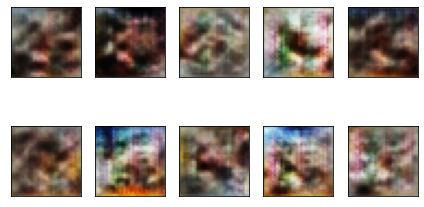

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7106 - generatorLoss: 0.7716
Epoch 89/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7104 - generatorLoss: 0.7716

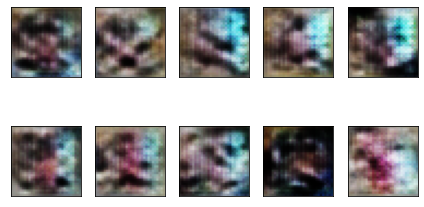

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.7103 - generatorLoss: 0.7716
Epoch 90/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7166 - generatorLoss: 0.7894

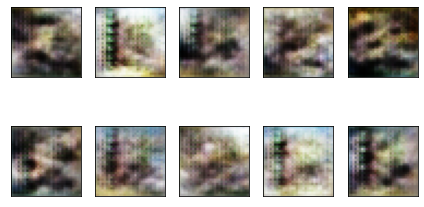

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7166 - generatorLoss: 0.7894
Epoch 91/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7025 - generatorLoss: 0.7643

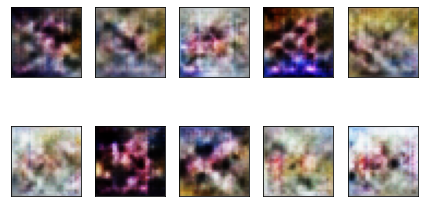

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7025 - generatorLoss: 0.7643
Epoch 92/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7044 - generatorLoss: 0.7658

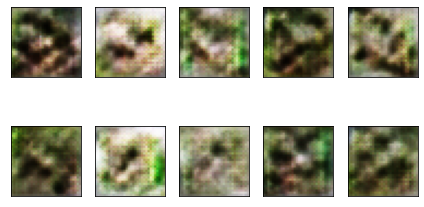

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.7044 - generatorLoss: 0.7659
Epoch 93/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7235 - generatorLoss: 0.7820

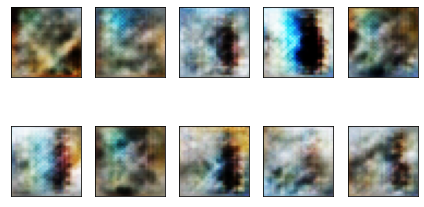

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7235 - generatorLoss: 0.7820
Epoch 94/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7090 - generatorLoss: 0.7768

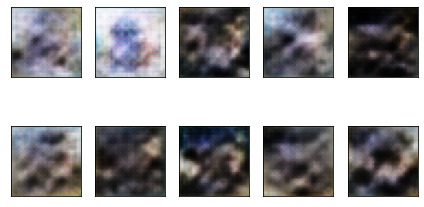

1875/1875 [==============================] - 79s 42ms/step - discriminatorLoss: 0.7090 - generatorLoss: 0.7768
Epoch 95/100
1874/1875 [============================>.] - ETA: 0s - discriminatorLoss: 0.7117 - generatorLoss: 0.7753

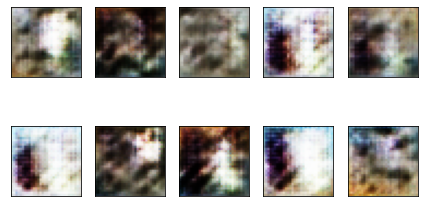

1875/1875 [==============================] - 78s 42ms/step - discriminatorLoss: 0.7117 - generatorLoss: 0.7754
Epoch 96/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7073 - generatorLoss: 0.7784

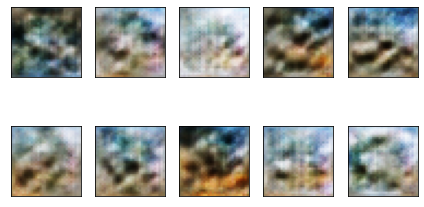

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7073 - generatorLoss: 0.7784
Epoch 97/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7143 - generatorLoss: 0.7699

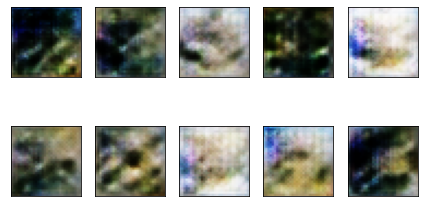

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.7143 - generatorLoss: 0.7699
Epoch 98/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7067 - generatorLoss: 0.7702

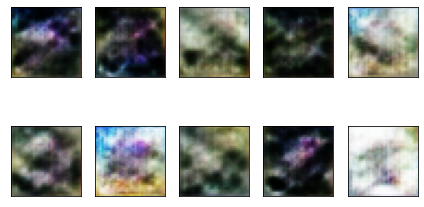

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.7067 - generatorLoss: 0.7702
Epoch 99/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.7082 - generatorLoss: 0.7761

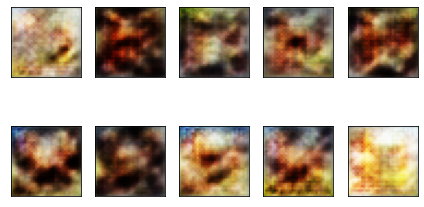

1875/1875 [==============================] - 78s 41ms/step - discriminatorLoss: 0.7082 - generatorLoss: 0.7761
Epoch 100/100
1875/1875 [==============================] - ETA: 0s - discriminatorLoss: 0.6996 - generatorLoss: 0.7675

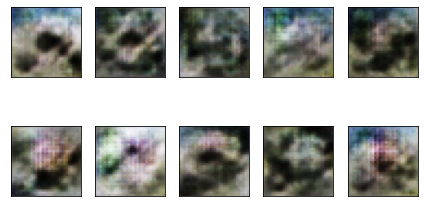

1875/1875 [==============================] - 77s 41ms/step - discriminatorLoss: 0.6996 - generatorLoss: 0.7675


In [7]:
epochs = 100

gan = GAN(discriminator=discriminator, generator=generator)
gan.compile()

history = gan.fit(dataset_images, epochs=epochs, callbacks=[customCallback(images=10)])

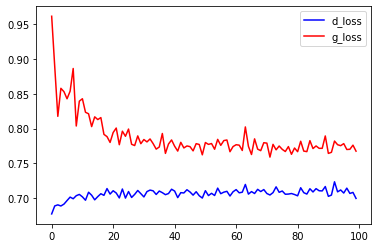

In [8]:
# Get losses from each epoch 
discriminatorLosses = (history.history)['discriminatorLoss']
generatorLosses = (history.history)['generatorLoss']

plt.plot(discriminatorLosses, label='d_loss', color='blue')
plt.plot(generatorLosses, label='g_loss', color='red')
plt.legend()

In [9]:
## Evaluating image quality w/ FID 

# define model
inception = keras.applications.InceptionV3(include_top=False, pooling='avg', input_shape=(299,299,3))

87924736/87910968 [==============================] - 1s 0us/step


In [11]:
from skimage.transform import resize
from scipy.linalg import sqrtm
from keras.applications.inception_v3 import preprocess_input

def upscale(images, new_shape):
	result = list()
	for image in images:
		# resize 
		upscaled = resize(image, new_shape, 0)
		# store
		result.append(upscaled)
	return np.asarray(result)
 
def getFID(model, img1, img2):
  # let the DCGAN run on two images
	activation1 = model.predict(img1)
	activation2 = model.predict(img2)
 
	# calculate mean and covariance 
	mean1, cov1 = activation1.mean(axis=0), np.cov(activation1, rowvar=False)
	mean2, cov2 = activation2.mean(axis=0), np.cov(activation2, rowvar=False)
 
	# get mean squared difference 
	meanDiff = np.sum((mean1 - mean2)**2.0)
 
	# calculate sqrt of product between cov
	sigmaMean = sqrtm(cov1.dot(cov2))
 
	if np.iscomplexobj(sigmaMean):
		sigmaMean = sigmaMean.real
	# calculate score
	FID = meanDiff + np.trace(cov1 + cov2 - 2.0 * sigmaMean)
	return FID

# define collections of 10 fake images
fakeSet1 = np.zeros((10,32,32,3))
noise = tf.random.normal(shape=(10, noise_shape))
fake = gan.generator(noise)
fake *= 255
fake.numpy()
for i in range(10):
  fakeSet1[i] = fake[i]

fakeSet2 = np.zeros((10,32,32,3))
noise = tf.random.normal(shape=(10, noise_shape))
fake = gan.generator(noise)
fake *= 255
fake.numpy()
for i in range(10):
  fakeSet2[i] = fake[i]

# preprocess sets
fakeSet1 = fakeSet1.astype('float32')
fakeSet2 = fakeSet2.astype('float32')

fakeSet1 = upscale(fakeSet1, (299,299,3))
fakeSet2 = upscale(fakeSet2, (299,299,3))

fakeSet1 = preprocess_input(fakeSet1)
fakeSet2 = preprocess_input(fakeSet2)

# FID between two sets of generated images
fid = getFID(inception, fakeSet1, fakeSet2)
print('FID (generated vs generated): %.3f' % fid)


fakeSet3 = np.zeros((10,32,32,3))
# get 10 real images
for i in range(10):
  rand = np.random.randint(0, dataset_images.shape[0])
  image = dataset_images[rand]
  fakeSet3[i] = dataset_images[rand]

# preprocessing
fakeSet3 = fakeSet3.astype('float32')
fakeSet3 = upscale(fakeSet3, (299,299,3))
fakeSet3 = preprocess_input(fakeSet3)

# FID between generated and real images
fid = getFID(inception, fakeSet1, fakeSet3)
print('FID (generated vs real): %.3f' % fid)

FID (generated vs generated): 145.941
FID (generated vs real): 481.136
